In [1]:
import pandas as pd
pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', None)
import os
import json
import networkx as nx
import altair as alt
alt.data_transformers.disable_max_rows()
import matplotlib.pyplot as plt
import numpy as np
import itertools
import collections
from tqdm.notebook import trange, tqdm

In [2]:
import sys

# sys.path.insert(0, '../dataset_generator/')
sys.path.append("..")
from dataset_generator.exceptional_metadata import *
members_df, books_df, events_df = get_shxco_exceptional_data()


### Reformat Events to Separate Out Subscriptions and Borrows

In [3]:
# turn events into timestamped values
events_df['start_datetime'] = pd.to_datetime(events_df.start_date, format='%Y-%m-%d', errors='coerce')
events_df['end_datetime'] = pd.to_datetime(events_df.end_date, format='%Y-%m-%d', errors='coerce')
events_df['subscription_purchase_datetime'] = pd.to_datetime(events_df.subscription_purchase_date, format='%Y-%m-%d', errors='coerce')

In [5]:
# copy and subset only events related to subscriptions, and expand uri fields
subscription_events = events_df.copy()
subscription_events = subscription_events[subscription_events.event_type.isin(['Subscription', 'Renewal', 'Supplement'])]
subset_subscription_events = subscription_events[['subscription_purchase_datetime','start_datetime', 'event_type', 'member_names', 'end_datetime', 'index_col', 'first_member_uri','second_member_uri']]
member_subs = pd.merge(left=subset_subscription_events, right=members_df, left_on="first_member_uri", right_on="uri")
member_subs = member_subs[member_subs.has_card]

In [24]:
# subset only events related to borrowing and create separate year and month columns for grouping
borrow_events = events_df[(events_df.event_type == 'Borrow') &(events_df.start_date.str.len() > 9) & (events_df.end_date.str.len() > 9)]
borrow_events.loc[:,'year'] = borrow_events.start_datetime.dt.year
borrow_events.loc[:,'month'] = borrow_events.start_datetime.dt.month
# get list of years and all months
month_ranges = {12: 'Winter',1: 'Winter',2: 'Winter',3 :'Spring',4:'Spring',5:'Spring',6:'Summer',7:'Summer',8:'Summer',9:'Fall', 10:'Fall',11:'Fall'}
borrow_events['season'] = borrow_events.month.map(month_ranges)
years = borrow_events.year.unique().tolist()
months = borrow_events.month.unique().tolist()
seasons = borrow_events.season.unique().tolist()

#### Create a Subscription Active Field on Borrow Events

In [25]:
# Merge borrow and subscription events to check if subscriptions where active when books where checked out
merged_borrows_subs = pd.merge(borrow_events, subset_subscription_events, on=['first_member_uri'], how='left')
merged_borrows_subs['subscription_active'] = np.where(((merged_borrows_subs.subscription_purchase_datetime_y >= merged_borrows_subs.start_datetime_x )|(merged_borrows_subs.start_datetime_x <= merged_borrows_subs.end_datetime_y )), True, False)

In [26]:
# Clean out the merged dataframe to only include rows for borrow events
merged_borrows_subs = merged_borrows_subs[merged_borrows_subs.event_type_x=='Borrow']
merged_borrows_subs = merged_borrows_subs[['start_date', 'first_member_uri', 'subscription_active', 'item_title', 'index_col_x']]
merged_borrows_subs = merged_borrows_subs[merged_borrows_subs.item_title.isna() == False]
merged_borrows_subs = merged_borrows_subs[merged_borrows_subs.duplicated() == False]

In [27]:
# Merge updated borrow events into original borrow events
merged_borrows_subs = merged_borrows_subs.rename(columns={'index_col_x':'index_col'})
updated_borrow_events = pd.merge(borrow_events, merged_borrows_subs, on=['index_col','start_date', 'first_member_uri', 'item_title'], how='inner')

In [28]:
def first_member_name(row):
    return members_df[members_df.uri == row].name.values[0]  
    
updated_borrow_events['first_name'] = updated_borrow_events['first_member_uri'].apply(first_member_name)

### Calculate Book Popularity

#### Calculate straight count-based popularity of top ten books

In [122]:
# Top ten books signed 
popularity_counts = updated_borrow_events.groupby(['item_title']).size().reset_index(name="overall_times_checked_out")
exceptional_popularity_counts = updated_borrow_events[updated_borrow_events.exceptional_types.isna()==False].groupby(['item_title']).size().reset_index(name="overall_exceptional_only")
unexceptional_popularity_counts = updated_borrow_events[updated_borrow_events.exceptional_types.isna()==True].groupby(['item_title']).size().reset_index(name="overall_unexceptional_only")

popularity_merged = pd.merge(popularity_counts, exceptional_popularity_counts, on=['item_title'], how='outer')
popularity_merged = pd.merge(popularity_merged, unexceptional_popularity_counts, on=['item_title'], how='outer')
popularity_merged
popularity_merged.sort_values(by=['overall_times_checked_out', 'overall_exceptional_only', 'overall_unexceptional_only'], ascending=[False, False, False])[0:10]

,item_title,overall_times_checked_out,overall_exceptional_only,overall_unexceptional_only
4192,The New Statesman and Nation,202,140.0,62.0
4907,Time and Tide,198,138.0,60.0
4194,The New Yorker,128,99.0,29.0
2519,Poems,114,28.0,86.0
132,A Portrait of the Artist as a Young Man,75,24.0,51.0
3452,The Criterion,69,49.0,20.0
2544,Pointed Roofs (Pilgrimage 1),68,39.0,29.0
953,Dubliners,65,18.0,47.0
3707,The Garden Party and Other Stories,58,14.0,44.0
2973,South Wind,56,21.0,35.0


In [121]:
alt.Chart(popularity_merged).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
#     color='Origin:N'
).properties(
    width=100,
    height=100
).repeat(
    row=['overall_times_checked_out', 'overall_exceptional_only', 'overall_unexceptional_only'],
    column=[ 'overall_unexceptional_only','overall_exceptional_only','overall_times_checked_out']
)

alt.RepeatChart(...)

In [124]:
# Top ten books signed 
seasonal_counts = updated_borrow_events.groupby(['year', 'season', 'item_title']).size().reset_index(name="seasonal_times_checked_out")

exceptional_seasonal_counts = updated_borrow_events[updated_borrow_events.exceptional_types.isna()==False].groupby(['year', 'season', 'item_title']).size().reset_index(name="seasonal_exceptional_only")

unexceptional_seasonal_counts = updated_borrow_events[updated_borrow_events.exceptional_types.isna()==True].groupby(['year', 'season', 'item_title']).size().reset_index(name="seasonal_unexceptional_only")

seasonal_merged = pd.merge(seasonal_counts, exceptional_seasonal_counts, on=['item_title', 'season','year'], how='outer')
seasonal_merged = pd.merge(seasonal_merged, unexceptional_seasonal_counts, on=['item_title', 'season','year'], how='outer')
seasonal_merged.fillna(0, inplace=True)
seasonal_merged.sort_values(by=['seasonal_times_checked_out', 'seasonal_exceptional_only', 'seasonal_unexceptional_only'], ascending=[False, False, False])[0:10]
# seasonal_counts.sort_values(by=['seasonal_times_checked_out'], ascending=False)[0:10]

,year,season,item_title,seasonal_times_checked_out,seasonal_exceptional_only,seasonal_unexceptional_only
10205,1937,Fall,Time and Tide,28,0.0,28.0
9881,1936,Winter,The New Yorker,24,22.0,2.0
8021,1935,Fall,The New Statesman and Nation,20,18.0,2.0
8067,1935,Fall,Time and Tide,20,18.0,2.0
9880,1936,Winter,The New Statesman and Nation,20,18.0,2.0
7031,1934,Fall,The New Statesman and Nation,20,14.0,6.0
7052,1934,Fall,Time and Tide,20,14.0,6.0
11131,1937,Winter,Time and Tide,20,12.0,8.0
10173,1937,Fall,The New Statesman and Nation,20,0.0,20.0
9024,1936,Fall,Time and Tide,18,18.0,0.0


In [127]:
alt.Chart(seasonal_merged).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
).properties(
    width=100,
    height=100
).repeat(
    row=['seasonal_times_checked_out', 'seasonal_exceptional_only', 'seasonal_unexceptional_only'],
    column=[ 'seasonal_unexceptional_only','seasonal_exceptional_only','seasonal_times_checked_out']
)

alt.RepeatChart(...)

We can see from these two approaches that overall popularity surfaces more books whereas seasonal highlights periodicals

In [130]:
sorted_years = updated_borrow_events.sort_values(by=['start_datetime']).year.unique().tolist()
popularity_metrics = pd.merge(popularity_counts, seasonal_counts, on=['item_title'])

season_ranges = {'Winter':'01', 'Spring':'04', 'Summer':'07','Fall':'10'}
popularity_metrics['month'] = popularity_metrics.season.map(season_ranges)
popularity_metrics['date'] = '01-' + popularity_metrics.month + '-' +popularity_metrics.year.astype(int).astype(str)
popularity_metrics['datetime'] = pd.to_datetime(popularity_metrics.date, format='%d-%m-%Y', errors='coerce')
# pd.cut(book_counts['total_counts'], bins=3, labels=['low', 'medium', 'high'])

field_x = 'overall_times_checked_out'
field_y = 'seasonal_times_checked_out'
selection = alt.selection_multi(fields=['year'], bind='legend')

corl = popularity_metrics[[field_x,field_y]].corr().iloc[0,1]
chart = alt.Chart(popularity_metrics).mark_circle().encode(
    x=field_x,
    y=field_y,
    color=alt.Color('year:O', scale=alt.Scale(scheme='redyellowblue'),  legend=alt.Legend(symbolLimit=0), sort=sorted_years),
    tooltip=['item_title', 'overall_times_checked_out', 'seasonal_times_checked_out', 'yearmonth(datetime)'],
#     opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
)
# .add_selection(
#     selection
# )
text = alt.Chart({'values':[{}]}).mark_text(
    align="left", baseline="top"
).encode(
    x=alt.value(5),  # pixels from left
    y=alt.value(5),  # pixels from top
    text=alt.value(f"r: {corl:.3f}"),
)
chart + text + chart.transform_regression(field_x, field_y).mark_line(color='black')

alt.LayerChart(...)

In [95]:

base = alt.Chart(popularity_metrics).encode(
    x=alt.X(f'{field_x}:Q', axis=alt.Axis(title='')),
    y=alt.Y(f'{field_y}:Q', axis=alt.Axis(title='')),
).properties(
    height=75,
    width=75,
)

# selection = alt.selection_single(fields=['node_title'])
chart = alt.layer(
    base.mark_circle().encode(
#         opacity=alt.condition(selection, alt.value(1), alt.value(0.2)),
        tooltip=['item_title', f'{field_1}', f'{field_2}'],
        color=alt.Color('year:O', scale=alt.Scale(scheme='redyellowblue'),  legend=alt.Legend(symbolLimit=0), sort=sorted_years),
    ),
    base.transform_regression(f'{field_1}', f'{field_2}').mark_line(color='black')
).facet(
    'yearmonth(datetime):N', columns=5
).properties(title='Comparing Graph Metrics for Each Member by Seasons and Year').resolve_scale(x='independent', y='independent').configure_legend(labelLimit= 0)
chart

In [97]:
# 
chart = alt.Chart(popularity_metrics).mark_circle().encode(
    x=field_x,
    y=field_y,
    color=alt.Color('year:O', scale=alt.Scale(scheme='redyellowblue'),  legend=alt.Legend(symbolLimit=0), sort=sorted_years),
    tooltip=['item_title', 'overall_times_checked_out', 'seasonal_times_checked_out', 'yearmonth(datetime)'],
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
).add_selection(
    selection
)
chart

alt.Chart(...)

We can see that generally there is some relationship between overall checkouts and frequency of checkout for some of the most popular titles but that for most popularity overall does not translate to consistency (which you would expect!)

**So real question is how should we measure popularity here?**

- Overall counts of popularity
- Consistency seasonally or annually
- Some metric combining these? 
- Popularity subseted out by types of members (subscribers vs not, or exceptional members vs not) OR types of books (missing books vs not)

In [65]:
def get_top_books_by_year(rows):
    sorted_rows = rows.sort_values(by=['times_checked_out'], ascending=False)[0:3]
    print(f'In {sorted_rows[0:1].season.values[0]} {sorted_rows[0:1].year.values[0]}, top books were: {dict(zip(sorted_rows.item_title.tolist(), sorted_rows.times_checked_out.tolist()))}')
    
book_counts = updated_borrow_events.groupby(['year', 'season', 'item_title']).size().reset_index(name='times_checked_out')
book_counts.groupby(['year', 'season']).apply(get_top_books_by_year)

In Fall 1919, top books were: {'Roderick Hudson': 2, "Characters of Shakespeare's Plays": 1, 'De Profundis': 1}
In Winter 1919, top books were: {'The Shadow Line: A Confession': 3, 'Heartbreak House: A Fantasia in the Russian Manner on English Themes': 3, 'Lord Jim': 2}
In Fall 1920, top books were: {'The London Mercury': 3, 'The Rape of the Lock': 2, 'The Idle Thoughts of an Idle Fellow': 2}
In Spring 1920, top books were: {'Dubliners': 3, 'Erewhon': 3, 'Totem and Taboo': 3}
In Summer 1920, top books were: {'The Light That Failed': 2, 'The Listeners, and Other Poems': 2, 'A Laodicean: A Story of To-day': 2}
In Winter 1920, top books were: {'The New Poetry: Anthology of Twentieth Century Verse in English': 2, 'Out of the East: Reveries and Studies in New Japan': 2, 'Percy Bysshe Shelley': 2}
In Fall 1921, top books were: {'George Gissing: A Critical Study': 4, 'The Russian Theatre under the Revolution': 3, "A Child's Garden of Verses": 2}
In Spring 1921, top books were: {'Dubliners': 5

""


In [67]:
season_ranges = {'Winter':'01', 'Spring':'04', 'Summer':'07','Fall':'10'}
book_counts['month'] = book_counts.season.map(season_ranges)
book_counts['date'] = '01-' + book_counts.month + '-' +book_counts.year.astype(int).astype(str)
book_counts['datetime'] = pd.to_datetime(book_counts.date, format='%d-%m-%Y', errors='coerce')

array([[<AxesSubplot:title={'center':'total_counts'}>]], dtype=object)

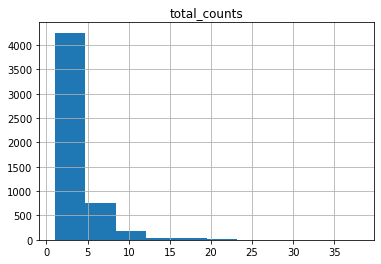

In [68]:
grouped_books = book_counts.groupby(['item_title']).size().reset_index(name='total_counts')
grouped_books.hist('total_counts')

In [69]:
book_counts = pd.merge(book_counts, grouped_books, on=['item_title'])

In [71]:
selection = alt.selection_multi(fields=['item_title'], bind='legend')
alt.Chart(book_counts[book_counts.total_counts > 22]).mark_line(point=True).encode(
    x='datetime:T',
    y='times_checked_out',
    color='item_title',
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2)),
    tooltip=['item_title', 'datetime']
).add_selection(selection)

alt.Chart(...)

In [72]:
book_counts['frequency']=pd.cut(book_counts['total_counts'], bins=3, labels=['low', 'medium', 'high'])

In [74]:
field_1 = 'total_counts'
field_2 = 'times_checked_out'
base = alt.Chart(book_counts).encode(
    x=alt.X(f'{field_1}:Q', axis=alt.Axis(title='')),
    y=alt.Y(f'{field_2}:Q', axis=alt.Axis(title='')),
).properties(
    height=75,
    width=75,
)

# selection = alt.selection_single(fields=['node_title'])
chart = alt.layer(
    base.mark_circle().encode(
#         opacity=alt.condition(selection, alt.value(1), alt.value(0.2)),
        tooltip=['item_title', f'{field_1}', f'{field_2}'],
        color=alt.Color('frequency:N', sort=['high','medium','low'])
    ),
    base.transform_regression(f'{field_1}', f'{field_2}').mark_line(color='black')
).facet(
    'yearmonth(datetime):N', columns=5
).properties(title='Comparing Graph Metrics for Each Member by Seasons and Year').resolve_scale(x='independent', y='independent').configure_legend(labelLimit= 0)
chart

alt.FacetChart(...)

In [76]:
# selection = alt.selection_multi(fields=['item_title'], bind='legend')
alt.Chart(book_counts[book_counts.total_counts > 14]).mark_circle().encode(
    x='total_counts:Q',
    y='times_checked_out:Q',
    color=alt.Color('item_title:N', scale=alt.Scale(scheme='redyellowblue')),
#     opacity=alt.condition(selection, alt.value(1), alt.value(0.2)),
    tooltip=['item_title','total_counts', 'times_checked_out']
).properties(
    height=50,
    width=50
).facet(
    facet='yearmonth(datetime):N',
    columns=4
)
# .add_selection(selection)

alt.FacetChart(...)

### Calculate Uniqueness of Books By Borrows Each Season

array([[<AxesSubplot:title={'center':'counts'}>]], dtype=object)

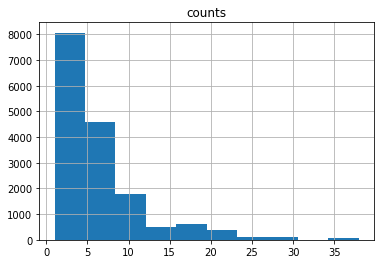

In [77]:
# Consistency of unique books over seasons
unique_books = borrow_events.groupby(['year', 'season'])['item_title'].apply(lambda x: list(np.unique(x))).reset_index(name='list_of_unique_books')
exploded_books = unique_books.explode('list_of_unique_books')
grouped_books = exploded_books.groupby('list_of_unique_books').size().reset_index(name='counts')
unique_book_counts = pd.merge(exploded_books, grouped_books, on=['list_of_unique_books'])
unique_book_counts.year = unique_book_counts.year.astype(int).astype(str) + '-01-01'
unique_book_counts.year = pd.to_datetime(unique_book_counts.year, format='%Y-%m-%d', errors='coerce')
unique_book_counts.hist('counts')

In [78]:
unique_books = borrow_events.groupby(['year', 'season'])['item_title'].apply(lambda x: list(np.unique(x))).reset_index(name='list_of_unique_books')
unique_books

,year,season,list_of_unique_books
0,1919,Fall,"[Characters of Shakespeare's Plays, De Profund..."
1,1919,Winter,"[A Diversity of Creatures, A Tarpaulin Muster,..."
2,1920,Fall,"[A Hundred and Seventy Chinese Poems, Androcle..."
3,1920,Spring,"[A Portrait of the Artist as a Young Man, Adve..."
4,1920,Summer,"[A Dark Lantern: A Story with a Prologue, A La..."
...,...,...,...
115,1955,Spring,"[Absalom, Absalom!, Light in August, The Hamle..."
116,1958,Spring,[Chamber Music]
117,1961,Fall,"[North America: Continent of Conjecture, The I..."
118,1961,Summer,[Thomas De Quincey's Works]


In [79]:
unique_book_counts.sort_values(by=['counts', 'year', 'season'], ascending=False)

,year,season,list_of_unique_books,counts
1741,1941-01-01,Summer,Poems,38
1740,1940-01-01,Summer,Poems,38
1739,1940-01-01,Spring,Poems,38
1738,1939-01-01,Winter,Poems,38
1737,1939-01-01,Spring,Poems,38
...,...,...,...,...
133,1919-01-01,Winter,The American Diary of a Japanese Girl,1
147,1919-01-01,Winter,The Story of Yone Noguchi: Told by Himself,1
148,1919-01-01,Winter,Uncle Remus: His Songs and His Sayings,1
149,1919-01-01,Winter,Van Bibber and Others,1


In [82]:
# Group members and books by years and months
members_grouped = updated_borrow_events.groupby([updated_borrow_events.year,updated_borrow_events.season,updated_borrow_events.month, updated_borrow_events.item_title])['first_member_uri'].apply(list).reset_index(name='list_members')

books_grouped1 = updated_borrow_events.groupby([updated_borrow_events.year,updated_borrow_events.season,updated_borrow_events.month, updated_borrow_events.first_member_uri])['item_title'].apply(list).reset_index(name='list_books')

In [83]:
names = updated_borrow_events[['first_member_uri', 'first_name']]
books_grouped = pd.merge(books_grouped1, names, on=['first_member_uri'])

In [84]:
def create_members_network(rows, graph):
    '''Create a graph from all members using shared books to connect members'''
    combos = list(itertools.combinations(rows.list_members, 2))
    if len(combos) > 0:
        graph.add_nodes_from(rows.list_members, item_title = rows.item_title, year=rows.year, month=rows.month, season=borrow_events.season)
        graph.add_edges_from(combos, item_title = rows.item_title, year=rows.year, month=rows.month, season=borrow_events.season)
    if len(combos) == 0:
        graph.add_nodes_from(rows.list_members, item_title = rows.item_title, year=rows.year, month=rows.month, season=borrow_events.season)

def create_books_network(rows, graph):
    '''Create a graph from all books using members who read the same book as an edges'''
    combos = list(itertools.combinations(rows.list_books, 2))
    if len(combos) > 0:
        graph.add_nodes_from(rows.list_books, member_name = rows.member_names, year=rows.year, month=rows.month, season=borrow_events.season)
        graph.add_edges_from(combos, member_name = rows.member_names, year=rows.year, month=rows.month, season=borrow_events.season)
    if len(combos) == 0:
        graph.add_nodes_from(rows.list_books, member_name = rows.member_names, year=rows.year, month=rows.month, season=borrow_events.season)


def create_bipartite_network(rows, graph):
    graph.add_node(rows.member_names, group='members', name=rows.member_names, year=rows.year, month=rows.month, season=rows.season)
    graph.add_node(rows.item_title, group='books', name=rows.item_title, year=rows.year, month=rows.month, season=rows.season)
    graph.add_edge(rows.member_names, rows.item_title, year=rows.year, month=rows.month, season=rows.season)



In [85]:
def get_network_metrics(graph, is_bipartite=False):
    '''Run network metrics for each node at various snapshots
    
    Some on going questions:
    - Should we remove self loops?
    - Are there more accurate metrics?
    - Should we try a chain model to more accurately capture order of reading?
    - What are the behaviors we want to include with book borrowing? Obviously there's waiting for a book to be available but what about recommendations? Or genre?
    '''
    if nx.is_empty(graph):
        return graph
    elif is_bipartite:
        top_nodes = [n for n in graph.nodes if graph.nodes[n]['group'] == 'members']
        bottom_nodes = [n for n in graph.nodes if graph.nodes[n]['group'] == 'books']
#         print(top_nodes, bottom_nodes)
        graph_components = sorted(nx.connected_components(graph), key=len, reverse=True)
        #Degree
        global_degree = bipartite.degree_centrality(graph, top_nodes)
        #Clustering
        top_global_clustering = bipartite.clustering(graph, top_nodes)
        bottom_global_clustering = bipartite.clustering(graph, bottom_nodes)
        #Closeness
        global_closeness = bipartite.closeness_centrality(graph, top_nodes)
        #Betweenness
        global_betweenness = bipartite.betweenness_centrality(graph, top_nodes)
        
        for index, component in enumerate(graph_components):
            subgraph = graph.subgraph(component)
            top_nodes = [n for n in subgraph.nodes if subgraph.nodes[n]['group'] == 'members']
            bottom_nodes = [n for n in subgraph.nodes if subgraph.nodes[n]['group'] == 'books']
            #Degree
            local_degree = bipartite.degree_centrality(subgraph, top_nodes)
            #Clustering
            top_local_clustering = bipartite.clustering(subgraph, top_nodes)
            bottom_local_clustering = bipartite.clustering(subgraph, bottom_nodes)
            #Closeness
            local_closeness = bipartite.closeness_centrality(subgraph, top_nodes)
            #Betweenness
            try:
                top_local_betweenness = bipartite.betweenness_centrality(subgraph, top_nodes)
            except ZeroDivisionError:
                top_local_betweenness = {k: 0 for k in top_nodes}
                
            try:
                bottom_local_betweenness = bipartite.betweenness_centrality(subgraph, bottom_nodes)
            except ZeroDivisionError:
                bottom_local_betweenness = {k: 0 for k in bottom_nodes}
            
            for d, v in subgraph.nodes(data=True):
                v['global_degree'] = global_degree[d]
                v['local_degree'] = local_degree[d]
                
                v['global_clustering'] = top_global_clustering[d] if 'members' in v['group'] else bottom_global_clustering[d]
                v['local_clustering'] = top_local_clustering[d] if 'members' in v['group'] else bottom_local_clustering[d]
                
                v['global_closeness'] = global_closeness[d]
                v['local_closeness'] = local_closeness[d]
                
                v['global_betweenness'] = global_betweenness[d]
                v['local_betweenness'] = top_local_betweenness[d] if 'members' in v['group'] else bottom_local_betweenness[d]
                
                v['node_title'] = d
                v['component'] = index
                
        
    else:
        degree = nx.degree_centrality(graph)
        closeness = nx.closeness_centrality(graph)
        global_betweenness = nx.betweenness_centrality(graph)
        harmonic = nx.harmonic_centrality(graph)
        graph_components = sorted(nx.connected_components(graph), key=len, reverse=True)
        clustering = nx.clustering(graph)

        for index, component in enumerate(graph_components):
            subgraph = graph.subgraph(component)
            diameter = nx.diameter(subgraph) if subgraph.size() > 0 else 0
            radius = nx.radius(subgraph) if subgraph.size() > 0 else 0
            eigenvector = nx.eigenvector_centrality_numpy(subgraph, max_iter=600) if subgraph.size() > 1 else {k: 0 for k in subgraph.nodes}
            local_betweenness = nx.betweenness_centrality(subgraph)
            
            for d, v in subgraph.nodes(data=True):
                if 'member_name' in v:
                    check_sub_status = borrow_events[(borrow_events.item_title == d) & (borrow_events.member_names == v['member_name']) & (borrow_events.year == v['year']) & (borrow_events.month == v['month'])]
                if 'item_title' in v:
                    check_sub_status = borrow_events[(borrow_events.member_names == d) & (borrow_events.item_title == v['item_title']) & (borrow_events.year == v['year']) & (borrow_events.month == v['month'])]
                v['subscription_active'] = check_sub_status.subscription_active.values[0]
                v['degree'] = degree[d]
#                 print(d in eigenvector)
                v['eigenvector'] = eigenvector[d]
                v['closeness'] = closeness[d]
                v['global_betweenness'] = global_betweenness[d]
                v['local_betweenness'] = local_betweenness[d]
                v['harmonic'] = harmonic[d]
                v['clustering'] = clustering[d]
                v['node_title'] = d
                v['graph_radius'] = radius
                v['diameter'] = diameter
                v['component'] = index
    return graph

In [86]:
from networkx.algorithms import bipartite
top_nodes = [n for n in bipartite_graph.nodes if bipartite_graph.nodes[n]['group'] == 'members']
bottom_nodes = [n for n in bipartite_graph.nodes if bipartite_graph.nodes[n]['group'] == 'books']

NameError: name 'bipartite_graph' is not defined

In [ ]:


# In[415]:


# Process the borrowers graph through the network metrics and return dataframes for each month and each year
books_dfs = []
members_dfs = []
bipartite_dfs = []
for year in tqdm(years[0:4]):
    for season in seasons:
#         print(year, month)
        # Make books graph for each month range
        book_graph = nx.Graph()
        books_grouped[(books_grouped.year == year) & (books_grouped.season == season)].apply(create_books_network, graph=book_graph, axis=1)
        book_graph.remove_edges_from(nx.selfloop_edges(book_graph))
        books_graph_processed = get_network_metrics(book_graph)
        books_df = pd.DataFrame.from_dict(dict(books_graph_processed.nodes(data=True)), orient='index').reset_index(drop=True)
        books_df['season'] = list(month.keys())[0]
        books_dfs.append(books_df)

        # Make members graph for each month range
        member_graph = nx.Graph()
        members_grouped[(members_grouped.year == year) & (members_grouped.season == season)].apply(create_members_network, graph=member_graph, axis=1)
        member_graph.remove_edges_from(nx.selfloop_edges(member_graph))
        members_graph_processed = get_network_metrics(member_graph)
        members_df = pd.DataFrame.from_dict(dict(members_graph_processed.nodes(data=True)), orient='index').reset_index(drop=True)
        members_df['season'] = list(month.keys())[0]
        members_dfs.append(members_df)
        
        bp_graph = nx.Graph()
        borrow_events[(borrow_events.year == year) & (borrow_events.season == season)].apply(create_bipartite_network, graph=bp_graph, axis=1)
        bp_graph_processed = get_network_metrics(bp_graph, True)
        bp_df = pd.DataFrame.from_dict(dict(bp_graph_processed.nodes(data=True)), orient='index').reset_index(drop=True)
        bp_df['season'] = list(month.keys())[0]
        bipartite_dfs.append(bp_df)